In [2]:
import pandas as pd
import os
import numpy as np
import librosa.display
import IPython
import matplotlib.pyplot as plt
import librosa
from scipy.io.wavfile import read as read_wav
import seaborn as sns
import torchaudio


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
def load_data_to_df(data_dir='shords_dataset/'):
    data = []
    for cl in os.listdir(data_dir):
        class_dir = os.path.join(data_dir, cl)
        for file in os.listdir(class_dir):
            if file.endswith('wav'):
                file_path = os.path.join(class_dir, file)
                data.append({'file_path': file_path, 'class': cl})
    df = pd.DataFrame(data)
    return df

In [5]:
def play_audio(path):
    sampling_rate, data=read_wav(path)
    return IPython.display.Audio(path, rate = sampling_rate)

def print_single_spectrogram(path, title=None):
    sample_rate, data = read_wav(path)
    if data.ndim == 2:  # If stereo, convert to mono
        mono = (data[:, 0] + data[:, 1]) / 2
    else:  # If mono
        mono = data
    
    plt.figure(figsize=(10, 4))
    plt.specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
    plt.title(title if title else 'Spectrogram')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(label='Intensity [dB]')
    plt.show()

import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read as read_wav

def print_single_waveform(path, title=None):
    sample_rate, data = read_wav(path)
    if data.ndim == 2:  # If stereo, convert to mono
        mono = (data[:, 0] + data[:, 1]) / 2
    else:
        mono = data
    time = np.linspace(0, len(mono) / sample_rate, num=len(mono))
    
    plt.figure(figsize=(10, 4))
    plt.plot(time, mono)
    plt.title(title if title else 'Waveform')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.show()

# Example usage:
# plot_single_waveform('path_to_your_audio_file.wav', title='Waveform')


In [6]:
data = load_data_to_df()

In [7]:
def extract_features(file_path):
    y, sr = librosa.load(file_path, duration=30)
    features = {
        'mfcc': np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13).T, axis=0),
        'chroma': np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0),
        'spectral_contrast': np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0),
        'zero_crossing_rate': np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0),
        'rms': np.mean(librosa.feature.rms(y=y).T, axis=0),
        'length': librosa.get_duration(y=y, sr=sr)
    }
    return features

features_list = []

for index, row in data.iterrows():
    features = extract_features(row['file_path'])
    features['class'] = row['class']
    features_list.append(features)
features_df = pd.DataFrame(features_list)


In [39]:

def print_multi_spectrogram(df, n):
    df_minor = df[df['class'] == 'minor'].sample(n=n)
    df_major = df[df['class'] == 'major'].sample(n=n)

    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(15, n * 5))

    for i, (index, row) in enumerate(df_minor.iterrows()):
        sample_rate, data = read_wav(row['file_path'])
        if data.ndim == 2:  # If stereo, convert to mono
            mono = (data[:, 0] + data[:, 1]) / 2
        else:  # If mono
            mono = data
        axes[i, 0].specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
        axes[i, 0].set_title(f"Minor - Sample {i+1}")
        axes[i, 0].set_ylabel('Frequency [Hz]')
        axes[i, 0].set_xlabel('Time [sec]')

    for i, (index, row) in enumerate(df_major.iterrows()):
        sample_rate, data = read_wav(row['file_path'])
        if data.ndim == 2:  # If stereo, convert to mono
            mono = (data[:, 0] + data[:, 1]) / 2
        else:  # If mono
            mono = data
        axes[i, 1].specgram(mono, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
        axes[i, 1].set_title(f"Major - Sample {i+1}")
        axes[i, 1].set_ylabel('Frequency [Hz]')
        axes[i, 1].set_xlabel('Time [sec]')

    plt.tight_layout()
    plt.show()

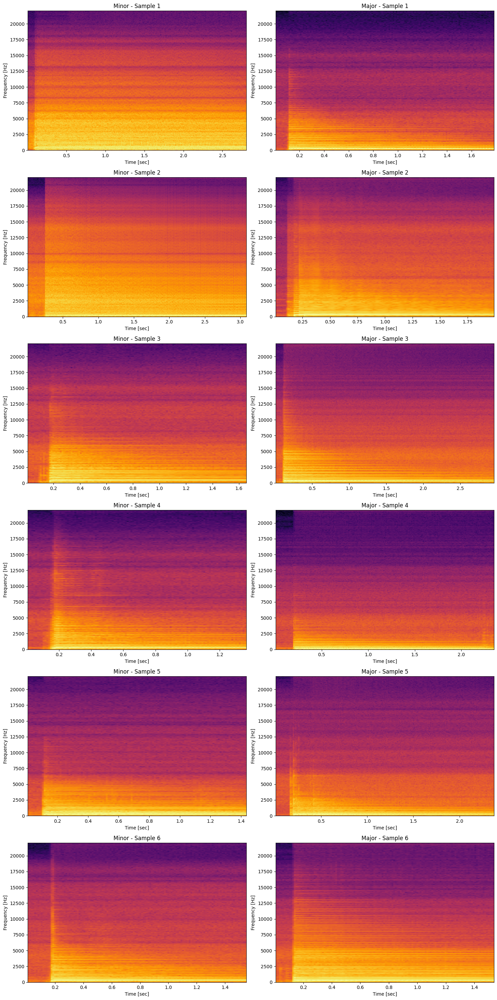

In [40]:
print_multi_spectrogram(data, 6)

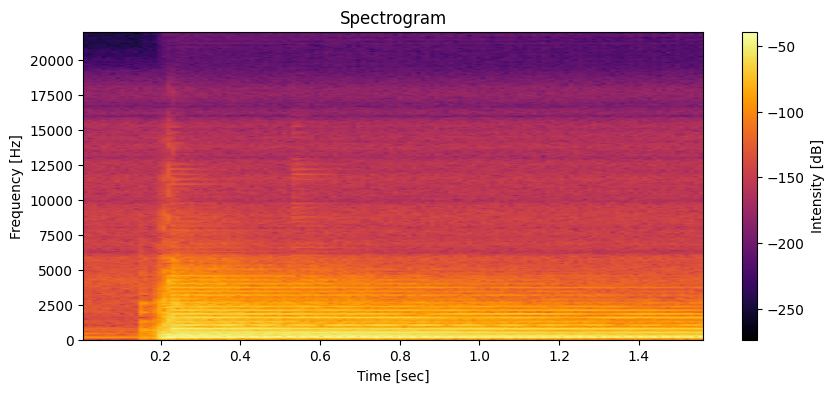

In [60]:
minor_example = data[data['class'] == 'minor'].sample(1).file_path.iloc[0]
print_single_spectrogram(minor_example)
play_audio(minor_example)

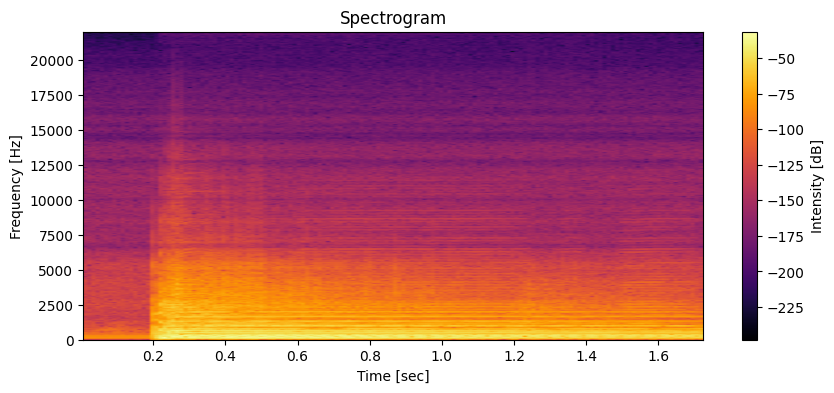

In [136]:
major_example = data[data['class'] == 'major'].sample(1).file_path.iloc[0]
print_single_spectrogram(major_example)
play_audio(major_example)

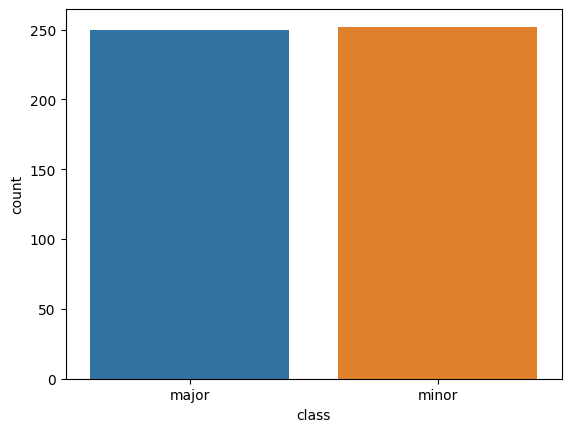

In [105]:
sns.countplot(data, x='class', hue='class')
plt.show()

<Axes: xlabel='length', ylabel='Count'>

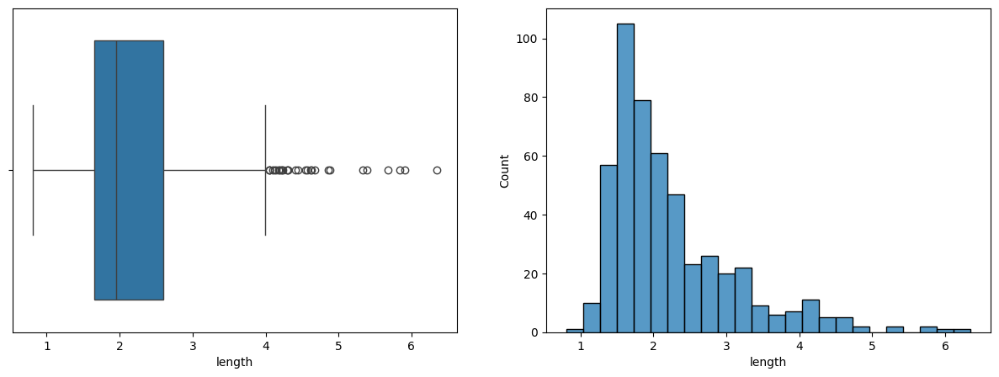

In [41]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 5))

sns.boxplot(data=features_df, x='length', ax=axes[0])
sns.histplot(data=features_df, x='length', ax=axes[1])


Example of long audio file

In [42]:
play_audio('shords_dataset/major/1_12.wav')

In [10]:
class_mapping = {'major': 0, 'minor': 1}
features_df['class'] = features_df['class'].map(class_mapping)

In [11]:
for col in features_df.columns:
    if col not in ['class', 'length']:
        print(features_df[col].apply(len).unique())

[13]
[12]
[7]
[1]
[1]


In [12]:
flattened_df = features_df[['class']]
for col in features_df.columns:
    if col not in ['class', 'length']:
        feature_length = features_df[col].apply(len).unique()[0]
        flattend_feature_df = pd.DataFrame(features_df[col].to_list(), columns = [f"{col}_{i}" for i in range(feature_length)])
        flattened_df = pd.merge(flattened_df, flattend_feature_df, left_index=True, right_index=True)

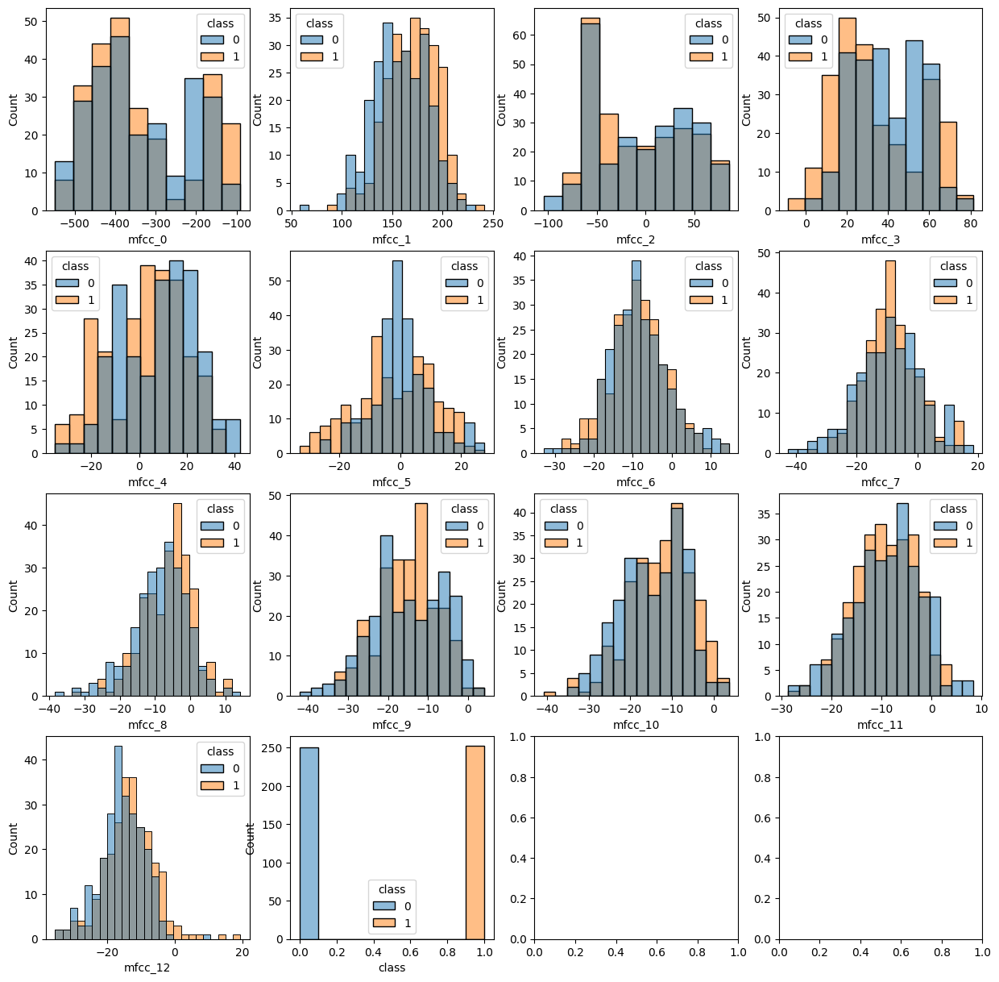

In [111]:
mfcc_columns = [col for col in flattened_df.columns if 'mfcc' in col] + ['class']

fig, axes = plt.subplots(ncols=4, nrows=4, figsize=(15, 15))

for i, ax in zip(mfcc_columns, axes.flat):
    sns.histplot(data=flattened_df, x=i, ax=ax, hue='class')
plt.show()


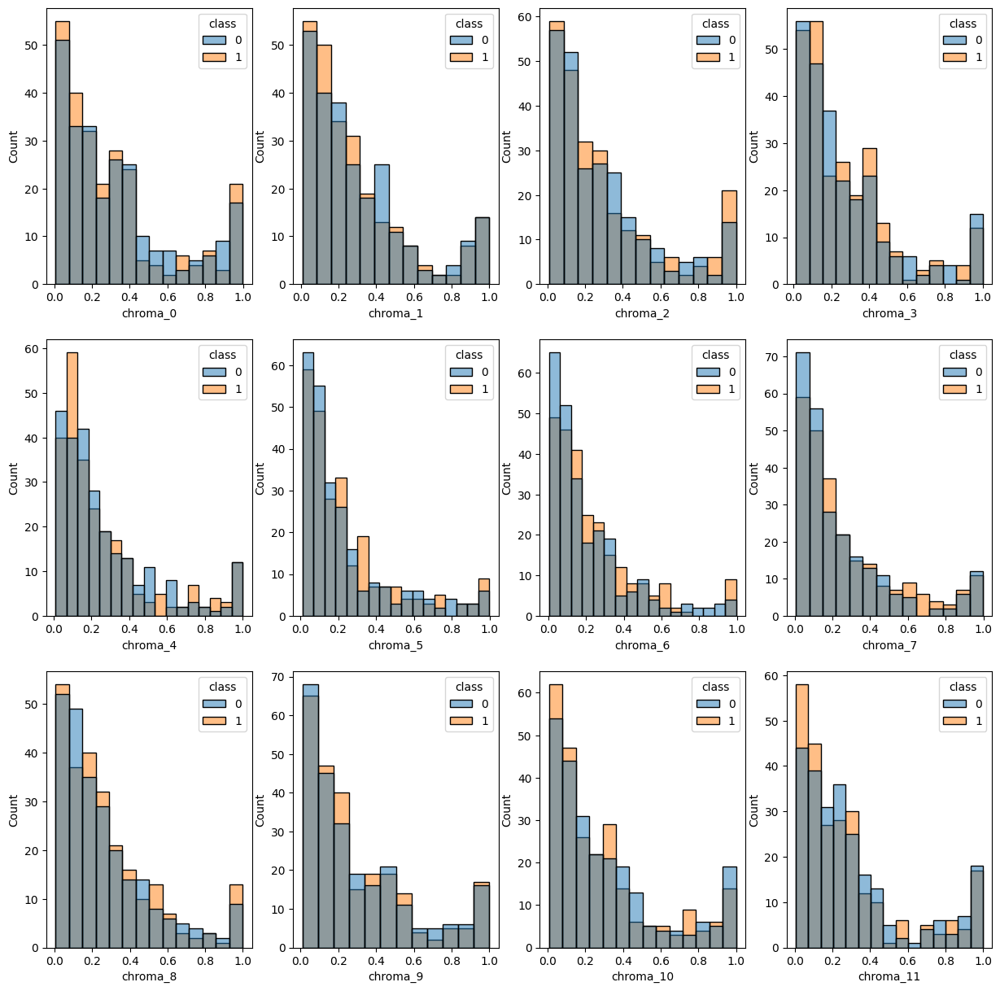

In [112]:
chroma_cols = [col for col in flattened_df.columns if 'chroma' in col] + ['class']
fig, axes = plt.subplots(ncols=4, nrows=3, figsize=(15, 15))

for i, ax in zip(chroma_cols, axes.flat):
    sns.histplot(data= flattened_df, x=i, ax=ax, hue='class')
plt.show()

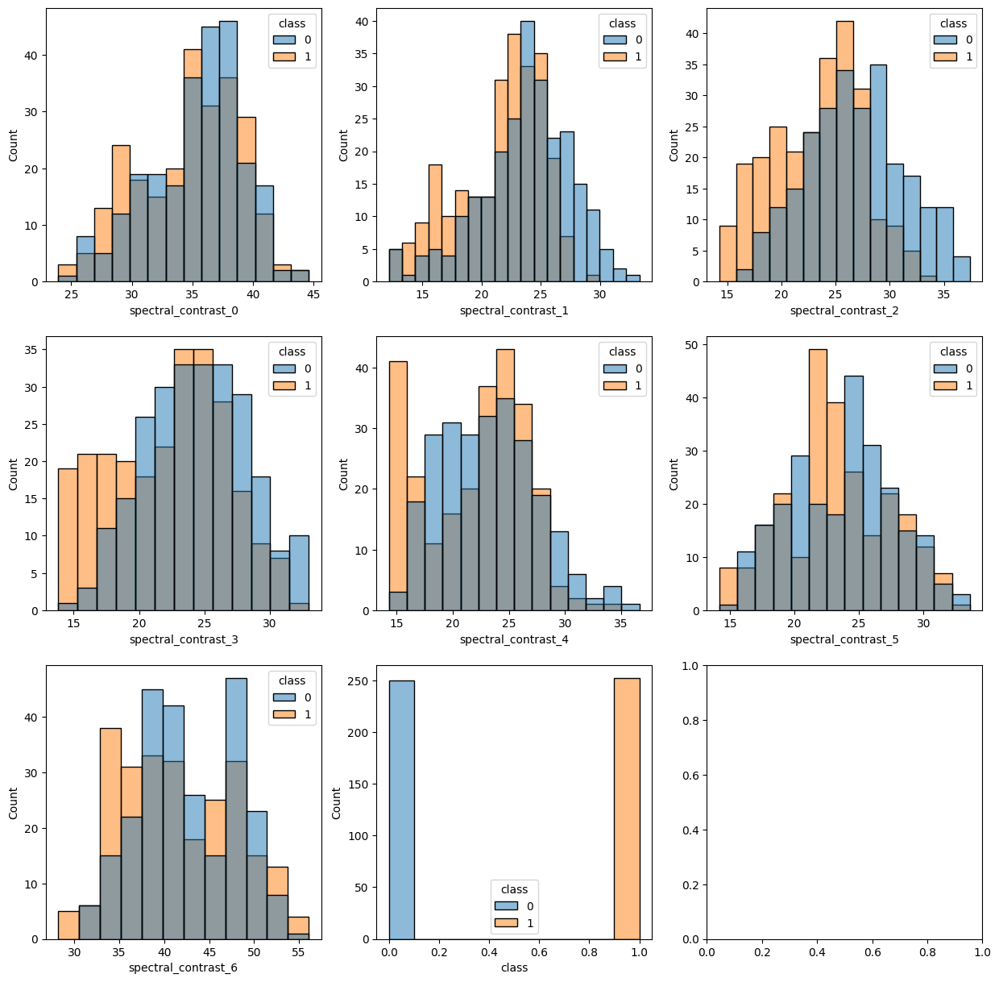

In [113]:
spectral_cols = [col for col in flattened_df.columns if 'spectral' in col] + ['class']
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(15, 15))

for i, ax in zip(spectral_cols, axes.flat):
    sns.histplot(data= flattened_df, x=i, ax=ax, hue='class')
plt.show()

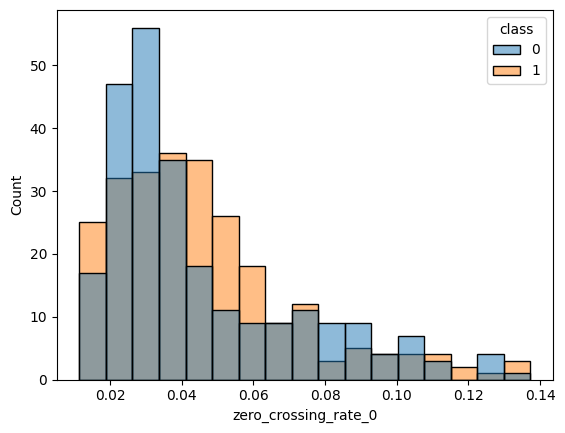

In [114]:
sns.histplot(data=flattened_df, x='zero_crossing_rate_0', hue='class')
plt.show()

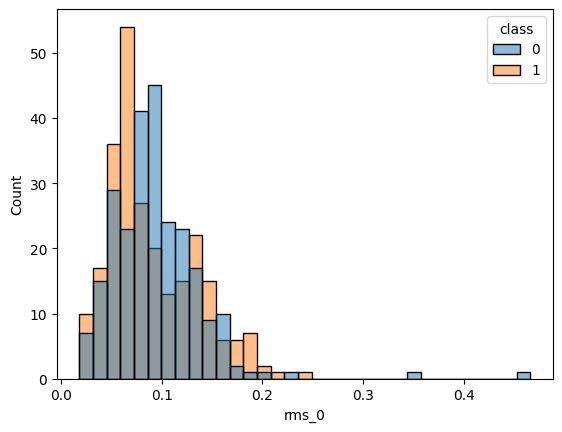

In [115]:
sns.histplot(data=flattened_df, x='rms_0', hue='class')
plt.show()

<Axes: >

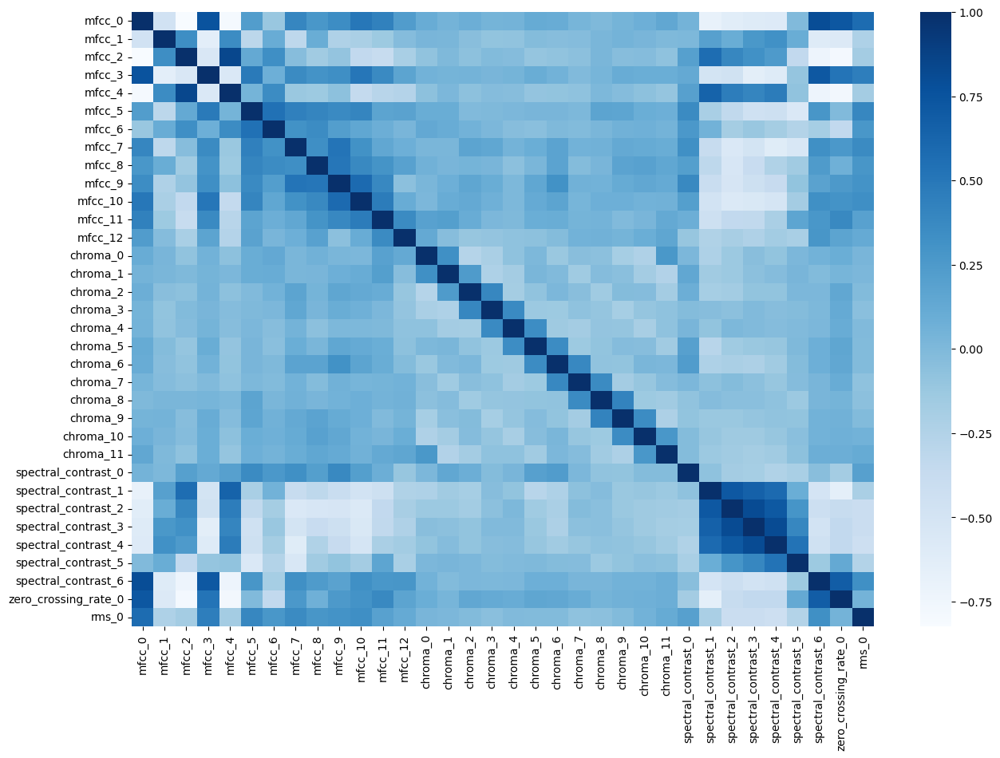

In [55]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(flattened_df.drop('class', axis=1).corr(), cmap='Blues')

# Train models

In [13]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [14]:
X = flattened_df.drop('class', axis=1)
y = flattened_df['class']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

              precision    recall  f1-score   support

       major       0.91      0.83      0.87        77
       minor       0.84      0.92      0.88        74

    accuracy                           0.87       151
   macro avg       0.88      0.88      0.87       151
weighted avg       0.88      0.87      0.87       151

Accuracy: 0.8741721854304636
Confusion Matrix:
 [[64 13]
 [ 6 68]]


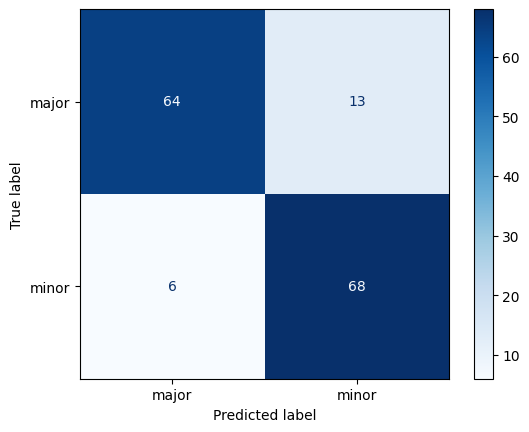

In [16]:
# Make predictions
y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=['major', 'minor']))

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', conf_matrix)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['major', 'minor'])
disp.plot(cmap=plt.cm.Blues)
plt.show()


In [133]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation accuracy: ", grid_search.best_score_)

best_xgb_model = grid_search.best_estimator_
best_xgb_model.fit(X_train, y_train)

y_pred_best = best_xgb_model.predict(X_test)

print("Best XGBoost Model Classification Report:\n", classification_report(y_test, y_pred_best, target_names=['major', 'minor']))
print("Best XGBoost Model Accuracy:", accuracy_score(y_test, y_pred_best))

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=0.8; total time=   0.0s
[CV] END colsamp

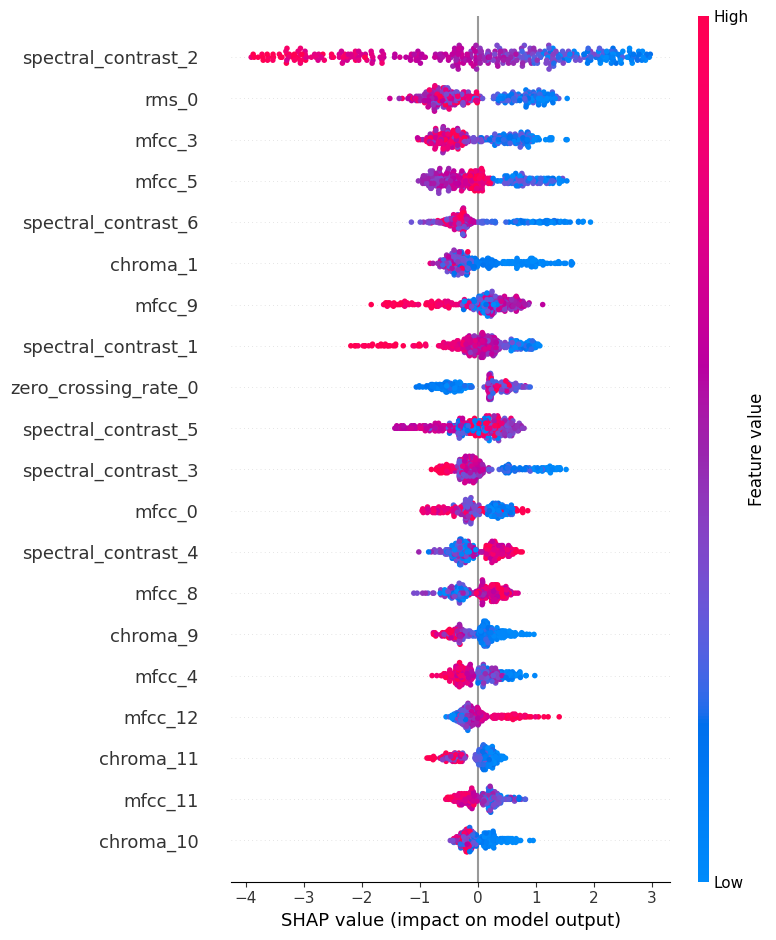

In [127]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

              precision    recall  f1-score   support

       major       0.84      0.86      0.85        77
       minor       0.85      0.82      0.84        74

    accuracy                           0.84       151
   macro avg       0.84      0.84      0.84       151
weighted avg       0.84      0.84      0.84       151

Accuracy: 0.8410596026490066
Confusion Matrix:
 [[66 11]
 [13 61]]


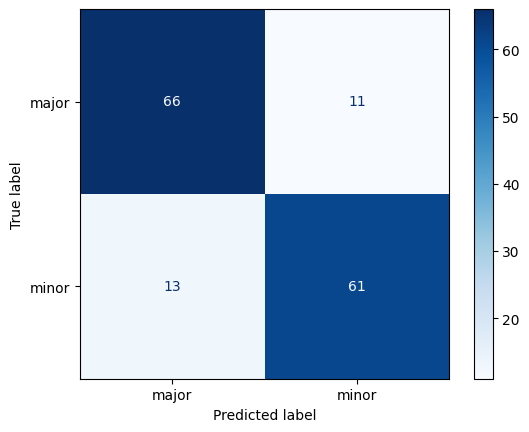

In [131]:
from sklearn.ensemble import RandomForestClassifier


rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=['major', 'minor']))

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', conf_matrix)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['major', 'minor'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [17]:
def record_chord(file_name, duration=5, sample_rate=44100):
    import sounddevice as sd
    import wavio

    print("Recording...")
    audio_data = sd.rec(int(duration * sample_rate), samplerate=sample_rate, channels=1, dtype='int16')
    sd.wait()  # Wait until recording is finished
    print("Recording finished")

    # Save the recorded audio to a file
    wavio.write(f"{file_name}.wav", audio_data, sample_rate, sampwidth=2)

In [5]:
record_chord("my_chord", duration=3)

Recording...
Recording finished


In [18]:
def load_my_chord(file_path):
    y, sr = librosa.load(file_path, duration=30)
    features = {
        'mfcc': np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13).T, axis=0),
        'chroma': np.mean(librosa.feature.chroma_stft(y=y, sr=sr).T, axis=0),
        'spectral_contrast': np.mean(librosa.feature.spectral_contrast(y=y, sr=sr).T, axis=0),
        'zero_crossing_rate': np.mean(librosa.feature.zero_crossing_rate(y).T, axis=0),
        'rms': np.mean(librosa.feature.rms(y=y).T, axis=0),
        'length': librosa.get_duration(y=y, sr=sr)
    }
    df = pd.DataFrame([features]) 
    flattened_df = pd.DataFrame([{}])
    for col in df.columns:
        if col != 'length':
            feature_length = df[col].apply(len).unique()[0]
            flattend_feature_df = pd.DataFrame(df[col].to_list(), columns = [f"{col}_{i}" for i in range(feature_length)])
            flattened_df = pd.merge(flattened_df, flattend_feature_df, left_index=True, right_index=True)
    return flattened_df

In [22]:
my_chord_x = load_my_chord("/Users/yarinr25/Downloads/archive (3)/piano_triads/A_maj_5_0.wav")